# Content <a id='content'></a>

[Introduction](#intro)

[Technological process overview](#tech)

[Datasets](#datasets)

[Data overview](#prep)

[ML](#ml)

[Conclusions](#conclusions)

# Introduction <a id='intro'></a>

I took a task of preparing a prototype of a machine learning model for Zyfra, the company which develops AI based efficiency solutions for heavy industry. The model should predict the amount of gold recovered from gold ore; it will help to optimize the production and eliminate unprofitable parameters. We have data on extraction and purification. To accomplish it, we will work through the following steps:

1. Pick the information that is important for the model development;
2. Prepare the data;
3. Perform data analysis;
4. Develop and train the model.
5. make conclusions.

## Technological process overview <a id='tech'></a>

### Modeling

Mined ore undergoes primary processing to get the ore mixture or rougher feed, which is the raw material for flotation (also known as the rougher process). After flotation, the material is sent to two-stage purification. Thus, the whole process includes the following steps:

1. Ore pre-processing into rougher feed (ore mixture);
2. Processing:

        2.1. Flotation;
        2.2. First purification;
        2.3. Second purification;
5. Post-processing of the final AU concentrate.

At each of the processing stages residues with a lower concentration of valuable metals are created (rougher tails). The `Flotation` is highly volatile: its stability is affected by the high variability of the physicochemical state of the flotation pulp (a mixture of solid particles and liquid).

### Feature naming

Here's how the features are named:

 `[stage].[parameter_type].[parameter_name]`
 
Example:

`rougher.input.feed_ag`

Possible values for `[stage]`:
- `rougher` — flotation
- `primary_cleaner` — primary purification
- `secondary_cleaner` — secondary purification
- `final` — final characteristics

Possible values for `[parameter_type]`:
- `input` — raw material parameters
- `output` — product parameters
- `state`  — parameters characterizing the current state of the stage

Possible values for `[parameter_name]` can be either process parameters or calculations and will be studied in more details during the data pre-processing.

### Target variables

We need to predict two values:

- rougher concentrate recovery - `rougher.output.recovery`
- final concentrate recovery - `final.output.recovery`

### Recovery calculation

As we cab note, `recovery` is a parameter name and we have been instructed that the following formula is used for its calculation:

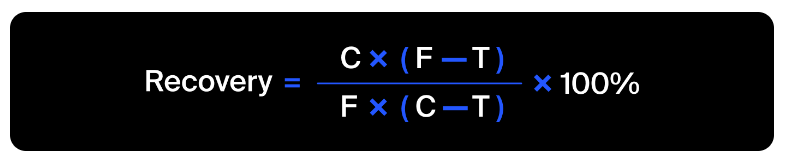,

where:

- F — share of gold in the feed;
- C — share of gold in the concentrate at the end of the stage;
- T — share of gold in the rougher tails at the end of the stage.

### Evaluation metric

To solve the problem, we will employ the following metric: symmetric Mean Absolute Percentage Error (sMAPE):

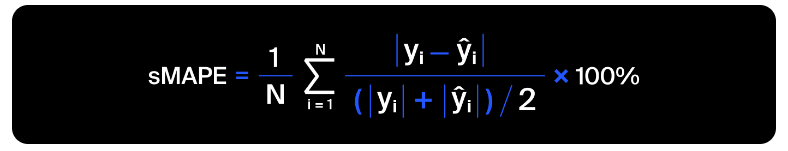

It is similar to MAE, but is expressed in relative values instead of absolute ones, and it equally takes into account the scale of both the target and the prediction.

The final metric will include the two values:

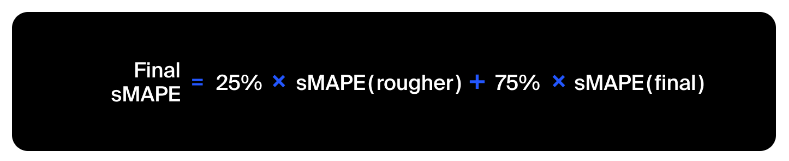

[Back to Content](#content)

# Datasets <a id='datasets'></a>

The data is stored in three files:

- `gold_recovery_train.csv`,
- `gold_recovery_test.csv`,
- `gold_recovery_full.csv`.

Notes:
1. Data is indexed with the date and time of acquisition (`date` feature).
2. Parameters that are next to each other in terms of time are often similar.
3. Some parameters are not available because they were measured and/or calculated much later. That's why, some of the features that are present in the training set may be absent from the test set.
4. The test set also doesn't contain targets.
5. The source dataset contains the training and test sets with all the features.


[Back to Content](#content)

# Data overview <a id='prep'></a>

Let's move on with the first step and download and prepare the data. We will:

1. Upload the files and look into the data.
2. Check that recovery is calculated correctly. Using the training set, we will calculate recovery for the rougher.output.recovery feature and find the MAE between our calculations and the feature values.
3. Find which features are not available in the test set.
4. Perform data preprocessing.

## Libraries

In [1]:
# import potentially necessary libraris and functions
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re

from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyRegressor
from sklearn import linear_model, ensemble
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline

from sklearn.metrics import mean_squared_error, mean_absolute_error, make_scorer

from math import sqrt
from scipy import stats as st

import plotly.express as px # advanced plotting
import plotly.graph_objects as go

## File upload

We will use a load() function to avoid potential problems with the file pathes.

In [2]:
# function `load` for a csv load with try-except and a number of rows limit
def load(filename, sep = ',', nrow = None):
    """
    i=In addition to the file name, the function takes nrows parameter
    for a particular number of rows to load. If None, then the file is loaded fully.
    """
    try:
        df_raw = pd.read_csv(filename, sep = sep, nrows = nrow)
    except:
        df_raw = pd.read_csv('/'+filename, sep = sep, nrows = nrow)
    return df_raw

In [3]:
# chec the dataset data types and memory usage on the first 500 rows
train_raw = load('datasets/gold_recovery_train.csv', nrow = 500)

In [4]:
train_raw.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                500 non-null    object 
 1   final.output.concentrate_ag                         500 non-null    float64
 2   final.output.concentrate_pb                         500 non-null    float64
 3   final.output.concentrate_sol                        412 non-null    float64
 4   final.output.concentrate_au                         500 non-null    float64
 5   final.output.recovery                               458 non-null    float64
 6   final.output.tail_ag                                500 non-null    float64
 7   final.output.tail_pb                                495 non-null    float64
 8   final.output.tail_sol                               496 non-null    float64
 9  

The data types and the column names are correct, except the `date` variable, the dataset does not look like the most memory-intensive for that number of variables, let's upload it alltogether:

In [5]:
train_raw = load('datasets/gold_recovery_train.csv')

In [6]:
train_raw.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                16860 non-null  object 
 1   final.output.concentrate_ag                         16788 non-null  float64
 2   final.output.concentrate_pb                         16788 non-null  float64
 3   final.output.concentrate_sol                        16490 non-null  float64
 4   final.output.concentrate_au                         16789 non-null  float64
 5   final.output.recovery                               15339 non-null  float64
 6   final.output.tail_ag                                16794 non-null  float64
 7   final.output.tail_pb                                16677 non-null  float64
 8   final.output.tail_sol                               16715 non-null  float64


Let's upload the other two datasets:

In [7]:
test_raw = load('datasets/gold_recovery_test.csv')

In [8]:
full_raw = load('datasets/gold_recovery_full.csv')

In [9]:
test_raw.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 53 columns):
 #   Column                                      Non-Null Count  Dtype  
---  ------                                      --------------  -----  
 0   date                                        5856 non-null   object 
 1   primary_cleaner.input.sulfate               5554 non-null   float64
 2   primary_cleaner.input.depressant            5572 non-null   float64
 3   primary_cleaner.input.feed_size             5856 non-null   float64
 4   primary_cleaner.input.xanthate              5690 non-null   float64
 5   primary_cleaner.state.floatbank8_a_air      5840 non-null   float64
 6   primary_cleaner.state.floatbank8_a_level    5840 non-null   float64
 7   primary_cleaner.state.floatbank8_b_air      5840 non-null   float64
 8   primary_cleaner.state.floatbank8_b_level    5840 non-null   float64
 9   primary_cleaner.state.floatbank8_c_air      5840 non-null   float64
 10  primary_clea

In [10]:
full_raw.info(memory_usage = 'deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22716 entries, 0 to 22715
Data columns (total 87 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   date                                                22716 non-null  object 
 1   final.output.concentrate_ag                         22627 non-null  float64
 2   final.output.concentrate_pb                         22629 non-null  float64
 3   final.output.concentrate_sol                        22331 non-null  float64
 4   final.output.concentrate_au                         22630 non-null  float64
 5   final.output.recovery                               20753 non-null  float64
 6   final.output.tail_ag                                22633 non-null  float64
 7   final.output.tail_pb                                22516 non-null  float64
 8   final.output.tail_sol                               22445 non-null  float64


From the overview of the variables above, we can conclude that possible values for `[parameter_name]` are:
- calculation characteristics, e.g. `recovery`;
- input process parameters, e.g. `rate` - feed rate, `size` - feed particle size, `sulfate`, `depressant`, `xanthate` - reagent additions, etc. ;
- process state parameters, e.g.  `air` - volume of air, `level` - fluid levels;
- physicochemical state characteristics, e.g. concentrations of metals `au` (Au), `ag` (Ag), `pb` (Pb), `sol` (?).

[Back to Content](#content)

## Basic preprocessing

Just to be on the safe side, let's check that the data does not contain duplciated data points.

In [11]:
train_raw.duplicated().sum(), test_raw.duplicated().sum(), full_raw.duplicated().sum()

(0, 0, 0)

No duplicates as well. Let's check what is the date format in the `date` column:

In [12]:
full_raw.head()

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691


Looks like we have hourly data of the `%Y-%m-%d %H:%M:%S` format. Let's cast the `date` variable and check what is the minimum and the maximum dates for each dataset:

In [13]:
train_raw['date']=pd.to_datetime(train_raw['date'], format = '%Y-%m-%d %H:%M:%S')

In [14]:
train_raw['date'].min(), train_raw['date'].max()

(Timestamp('2016-01-15 00:00:00'), Timestamp('2018-08-18 10:59:59'))

In [15]:
test_raw['date']=pd.to_datetime(test_raw['date'], format = '%Y-%m-%d %H:%M:%S')

In [16]:
test_raw['date'].min(), test_raw['date'].max()

(Timestamp('2016-09-01 00:59:59'), Timestamp('2017-12-31 23:59:59'))

In [17]:
full_raw['date']=pd.to_datetime(full_raw['date'], format = '%Y-%m-%d %H:%M:%S')

In [18]:
full_raw['date'].min(), full_raw['date'].max()

(Timestamp('2016-01-15 00:00:00'), Timestamp('2018-08-18 10:59:59'))

The three datasets start at January 01, 2015 00:00:00, the whole datasets and the train dataset end on August 18, 2018 at 10:59:59, while the test dataset ends on January 14, 2017 at 22:59:59.

Let's check what is going on with the missing values:

In [19]:
full_raw.set_index('date').astype('bool').mean().sort_values(ascending = False).min()

0.8785437577038211

In [20]:
train_raw.set_index('date').astype('bool').mean().sort_values(ascending = False).min()

0.8637010676156583

In [21]:
test_raw.set_index('date').astype('bool').mean().sort_values(ascending = False).min()

0.9369877049180327

Thus, the worst case of data lacking for any variable in the source dataset is about 13%; given that we are dealing with time series here, which as we were instructed in advance, are slowly evolving, we can just fill the missing values using the `.interpolate()` method (linear by default) for the time series. Let's do that:

We are dropping the observations with missing targets before filling the other columns to keep the highest degree of certainty about the target variables and, thus, the metric, which is calculated based on them.

In [22]:
full = full_raw.copy().dropna(subset = ['rougher.output.recovery', 'final.output.recovery'],
                              axis = 0).set_index('date').interpolate(axis = 0)

In [23]:
full.shape

(19439, 86)

In [24]:
train = train_raw.copy().dropna(subset = ['rougher.output.recovery', 'final.output.recovery'],
                              axis = 0).set_index('date').interpolate(axis = 0)

In [25]:
train.shape

(14149, 86)

In [26]:
test = test_raw.copy().set_index('date').interpolate(axis = 0)  # we do not have target variables in the test dataset

[Back to Content](#content)

## EDA

### Features

To make it easier to overview the data, let's start with visualizing the test subset (contains only `input` and `state` data) features as a flow ([see this article](https://towardsdatascience.com/histogram-on-function-space-4a710241f026)) (we remember that calculated features may be absent from the test set and it also does not contain targets). Let's devide the variables into several groups by their meaning:

In [27]:
# extract the variable names
test_feature_names = test.columns.to_list()

In [28]:
# extract the group of the input variable names
test_input_feature_names = [x for x in test_feature_names if re.findall('input', x)]

In [29]:
# extract the group of the size variable names from the input variable names
test_input_size_feature_names = [x for x in test_input_feature_names if re.findall('size', x)]

In [30]:
# extract the group of the bank level variable names from the input variable names
test_level_feature_names = [x for x in test_feature_names if re.findall('level', x)]

In [31]:
# extract the group of the chemical characteristics variable names from the input variable names
test_input_chemical_feature_names = [x for x in test_input_feature_names if (x not in test_input_size_feature_names) &
                                                                              (x not in test_level_feature_names) &
                                                                                (not re.findall('rate', x))]

In [32]:
# extract the group of the air concentration variable names from the input variable names
test_air_feature_names = [x for x in test_feature_names if re.findall('air', x)]

Now, let's plot data point variable value flows:

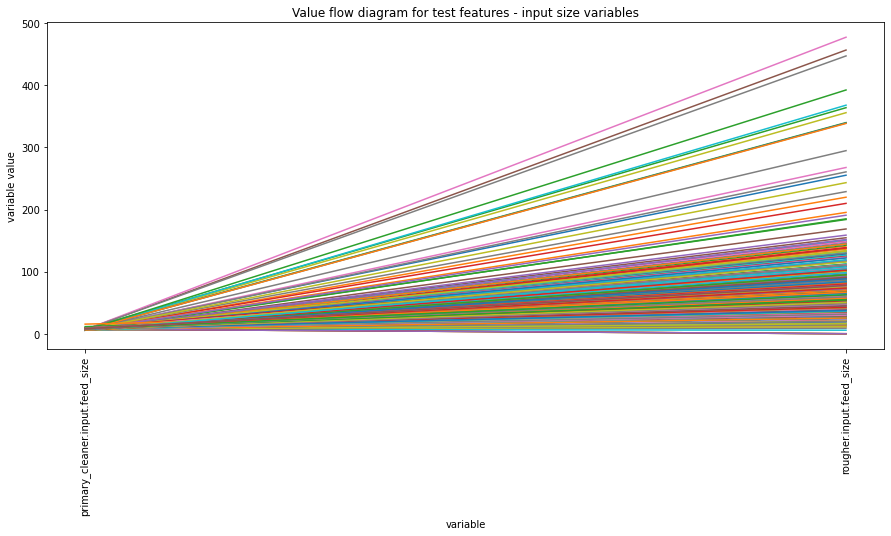

In [33]:
plt.figure(figsize=(15,6))
plt.plot(test[test_input_size_feature_names].T)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram for test features - input size variables")
plt.xticks(rotation=90)
plt.show()

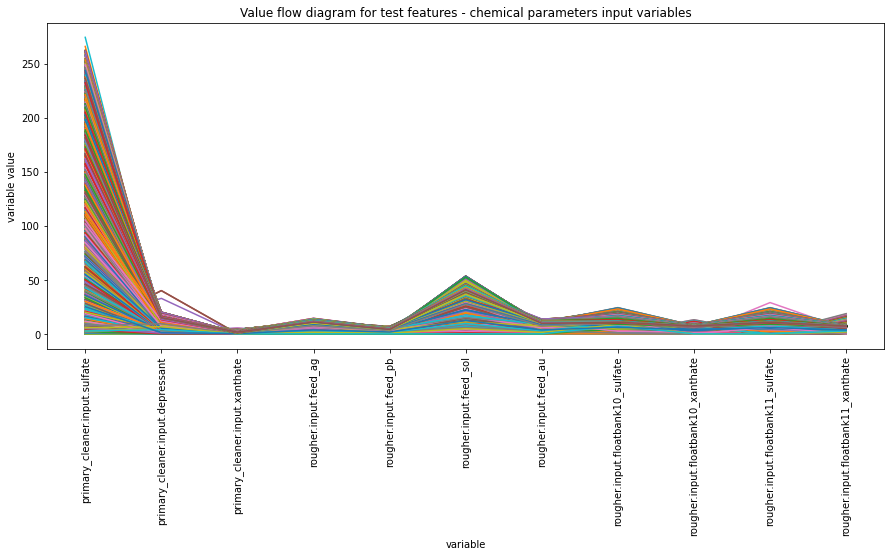

In [34]:
plt.figure(figsize=(15,6))
plt.plot(test[test_input_chemical_feature_names].T)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram for test features - chemical parameters input variables")
plt.xticks(rotation=90)
plt.show()

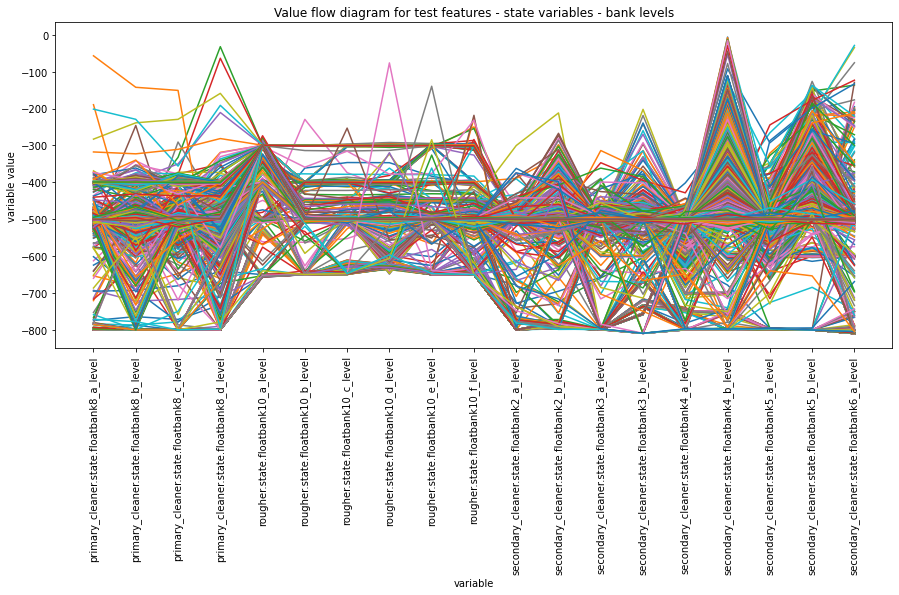

In [35]:
plt.figure(figsize=(15,6))
plt.plot(test[test_level_feature_names].T)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram for test features - state variables - bank levels")
plt.xticks(rotation=90)
plt.show()

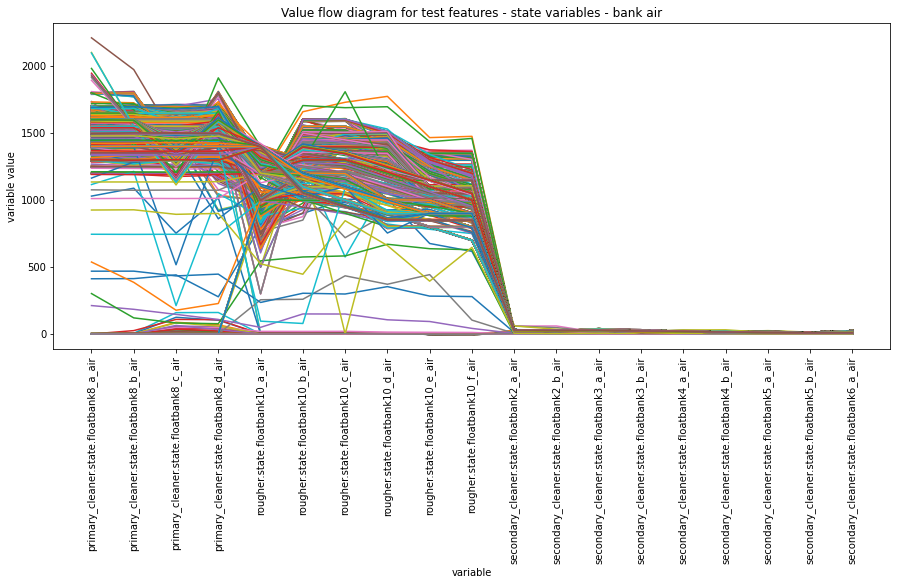

In [36]:
plt.figure(figsize=(15,6))
plt.plot(test[test_air_feature_names].T)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram for test features - state variables - bank air")
plt.xticks(rotation=90)
plt.show()

We see that of the particle size starts to be low and less volitile after the flotation, the most variation in the chemical state variables can be found in the `sol` and `sulfate` additive variables, `bank10` differs from other banks by its level pattern, air concentration in banks 2 to 6 is near zero, while the most variability can be found in banks 8_c, 8_d, and 10_a. We can discuss with the field experts to what degree this variables influenece the target variables.

Let's take a look at the features as time series. We will start from the test dataset:

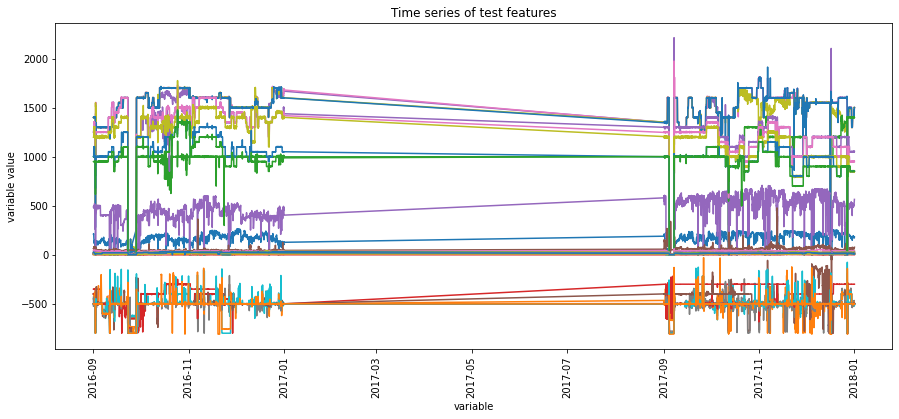

In [37]:
plt.figure(figsize=(15,6))
plt.plot(test)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Time series of test features")
plt.xticks(rotation=90)
plt.show()

Interestingly, the test period consists of two chunks of time: September to December, 2016 and September to December, 2018. Let's take a look at the same features in the train dataset:

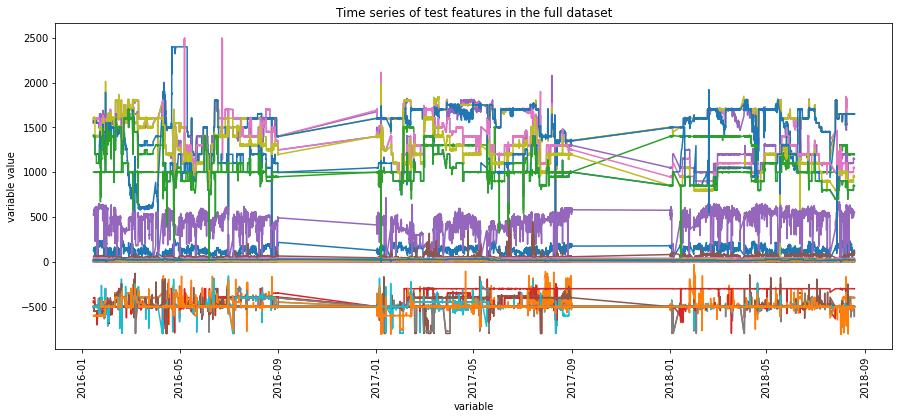

In [38]:
plt.figure(figsize=(15,6))
plt.plot(train[test_feature_names])
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Time series of test features in the full dataset")
plt.xticks(rotation=90)
plt.show()

Thus, we have three chunks of time for the train dataset: the data of the train dataset does not contain the data points of the test dataset.

Let's check out the scatter matrix for the test dataset. Due to the amount of the variables we will use only the `final.output.concentrate` and the `rougher.input.feed` variables:

In [39]:
# extract the group of the input variable names
corr_matrix_vars = [x for x in full.columns.to_list() if (re.findall('rougher.input.feed', x) or
                                                            re.findall('final.output.concentrate_au', x))]

In [40]:
viz_df = train[corr_matrix_vars]
viz_df.columns = [x.split('.')[-1] for x in viz_df.columns.to_list()]

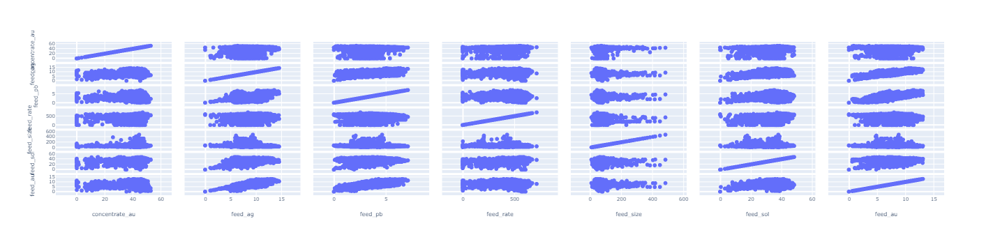

In [41]:
import plotly.express as px
fig = px.scatter_matrix(viz_df)
fig.update_layout(font_size=7)
fig.show()

Hm... the output `concentrate_au` exhibits some complex dependency on the feed particle size and nothing more explicitly expressed. In general, the overall concentration of the metals in the ore is positively correlated. Let's make a closer look at `concentrate_au`, `feed_size` and `feed_au` (we will filter positive values only):

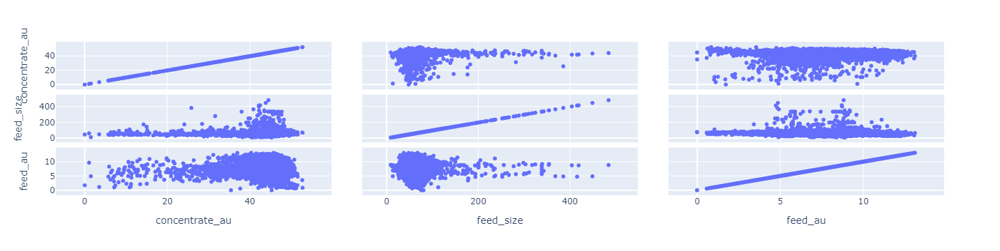

In [42]:
import plotly.express as px
fig = px.scatter_matrix(viz_df[['concentrate_au',
                                'feed_size',
                                'feed_au']].query('concentrate_au > 0 & feed_au > 0 & feed_size > 0'))
fig.update_layout(font_size=12)
fig.show()

Nothing easily interpretable. Let's check that the feed particle size distributions in the training set and in the test set are identical: if the distributions vary significantly, the model evaluation can be problematic.

In [43]:
test_raw['rougher.input.feed_size'].describe()

count    5834.000000
mean       55.937535
std        22.724254
min         0.046369
25%        43.890852
50%        50.002004
75%        61.638434
max       477.445473
Name: rougher.input.feed_size, dtype: float64

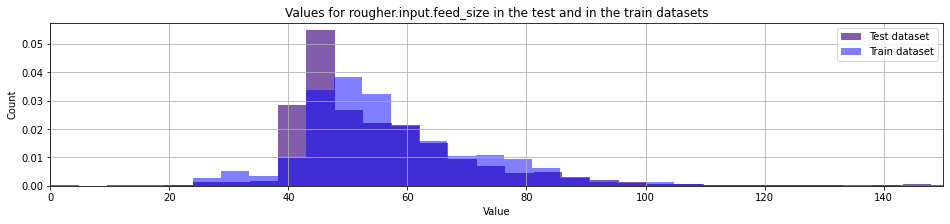

In [44]:
plt.figure(figsize=(16, 3))
test_raw['rougher.input.feed_size'].hist(color = "rebeccapurple", bins = 100, density=True, alpha = 0.8)
train_raw['rougher.input.feed_size'].hist(color = "blue", bins = 100, density = True, alpha = 0.5)
plt.title('Values for rougher.input.feed_size in the test and in the train datasets')
plt.xlabel('Value')
plt.ylabel('Count')
plt.legend(['Test dataset', 'Train dataset'])
plt.xlim(0,150)
plt.show()

In [45]:
train_raw['rougher.input.feed_size'].describe()

count    16443.000000
mean        58.676444
std         23.922591
min          9.659576
25%         47.575879
50%         54.104257
75%         65.051064
max        484.967466
Name: rougher.input.feed_size, dtype: float64

As we can see, the distributions of the particle sizes for the two datasets differ with the test set having slightly lower values, mostly due to a higher proportion of particles with sizes between 40 and 50. Let's test whether the two distributions are still drawn from the same population and can be seen as similar.

### Testing the hypothesis of difference between the two distributions of the particle sizes

In what follows, we will employ the Wilcoxon-Mann-Whitney Nonparametric Test to test the hypothesis of difference beetween distributions and t-test of difference between distribution means. Nonparametric methods, in general, do not make assumptions about how the data is distributed, so one does not have to estimate the distribution's parameters (parametric methods use a sample to evaluate the parameters of the expected distribution, for example, the mean). These methods are used when hypotheses of normality are not relevant, especiially when samples are small. In our case, the sample is big, testing the means to be enough. 

Let's formulate the null and the alternative hypotheses for testing with WMW:
1. The null hypothesis: there is no difference in the distributions of particle sizes between the datasets.
2. Alternative hypothesis: the distribution of particle sizes are different.
3. p-value: 0.05. We will reject the null hypothesis if the p-value is higher.

In [46]:
print(st.mannwhitneyu(train['rougher.input.feed_size'],     # using train and test which do not
                                       test['rougher.input.feed_size'])[1])  # contain NaNs

2.063524784330103e-137


Let's formulate the null and the alternative hypotheses for testing with t-test:

1. The null hypothesis: there is no difference in the means of the distributions of particle sizes for the two datasets.
2. Alternative hypothesis: the means are different.
3. p-value: 0.05. We will reject the null hypothesis if the p-value is higher.

Before we perform the t-test though, we have to test whether the variances of the two distributions are equal (we will employ the Levene test for that):
1. The null hypothesis: there is no difference in the variances of the distributions of particle sizes for the two datasets.
2. Alternative hypothesis: the variances are different.
3. p-value: 0.05. We will reject the null hypothesis if the p-value is higher.

In [47]:
st.levene(train['rougher.input.feed_size'], test['rougher.input.feed_size'])[1]

0.3719074473577433

The variances are different; that should be taken into account with the `equal_var` paramter of the t-test:

In [48]:
st.ttest_ind(train['rougher.input.feed_size'], test['rougher.input.feed_size'], equal_var=False)[1]

2.1712314528111185e-32

It follows from the two tests, of the distributions and of the distribution means, that the distributions of the train and the test datasets are drawn from different populations. Given the time series nature of the data we can assume that, with the time, the production conditions can evolve, hence the difference. The question now is how to deal with that fact. Let's try and see what the differences are in the two datasets:

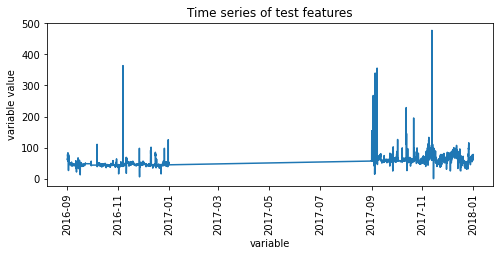

In [49]:
plt.figure(figsize=(8,3))
plt.plot(test['rougher.input.feed_size'])
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Time series of test features")
plt.xticks(rotation=90)
plt.show()

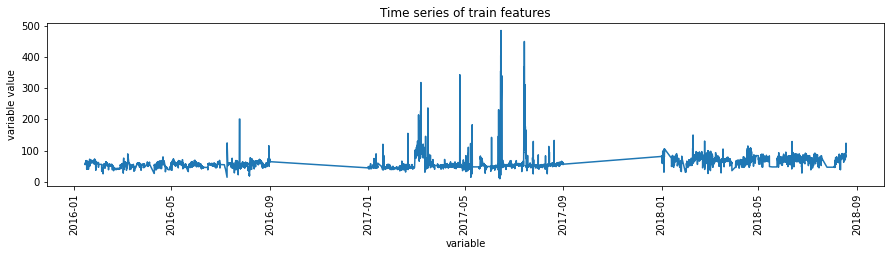

In [50]:
plt.figure(figsize=(15,3))
plt.plot(train['rougher.input.feed_size'])
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Time series of train features")
plt.xticks(rotation=90)
plt.show()

As these two plots suggest, the distributions for any period, both in the train and in the test dataset, vary a lot:

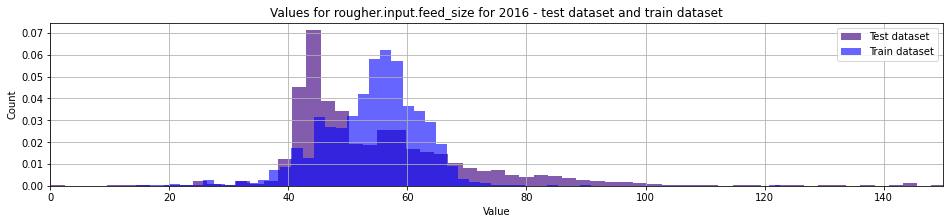

In [51]:
plt.figure(figsize=(16, 3))
test['2016-08-31 00:00:00':]['rougher.input.feed_size'].hist(color = "rebeccapurple", density = True,
                                                             alpha = 0.8, bins = 200)
train['2016-01-01 00:00:00':'2016-08-31 00:00:00']['rougher.input.feed_size'].hist(color = "blue",
                                                                                   alpha = 0.6,
                                                                                   density = True, bins = 100)
plt.title('Values for rougher.input.feed_size for 2016 - test dataset and train dataset')
plt.xlabel('Value')
plt.ylabel('Count')
plt.xlim(0,150)
plt.legend(['Test dataset', 'Train dataset'])
plt.show()

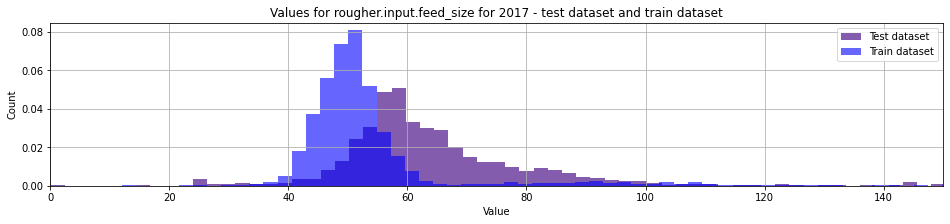

In [52]:
plt.figure(figsize=(16, 3))
test['2017-08-31 00:00:00':]['rougher.input.feed_size'].hist(color = "rebeccapurple", alpha = 0.8,
                                                             density = True, bins = 200)
train['2017-01-01 00:00:00':'2017-08-31 00:00:00']['rougher.input.feed_size'].hist(color = "blue",
                                                                                   alpha = 0.6,
                                                                                   density = True,
                                                                                   bins = 200)
plt.title('Values for rougher.input.feed_size for 2017 - test dataset and train dataset')
plt.xlabel('Value')
plt.ylabel('Count')
plt.xlim(0,150)
plt.legend(['Test dataset', 'Train dataset'])
plt.show()

Well, it looks like the two periods have different distributions actually, for all parts, both in the train and in the test dataset.

Thus, this study case shows that distributions of the feature values can vary, both between the train and the test subsets and within them. Assuming that the production process itself evolves slowly, we will develop a static model, given that for the both datasets, the train and the test ones, we have a mix of two to three subsets, which together result in mixed distributions which, in turn, are closer to each other. We will employ cross-validation to make the distribution of each validation subset as close to the original data as possible, and hopefully build a more robustic model, which will score decently on the test dataset as well. 

[Back to Content](#content)

### Measured features

Let's explore how the concentrations of metals (Au, Ag, Pb) change depending on the purification stage.

First, we will extract the list of concentration-related variables to use it in what follows:

In [53]:
concentrate_vars_au = [x for x in train.columns.to_list() if 'output.concentrate_au' in x]
concentrate_vars_ag = [x for x in train.columns.to_list() if 'output.concentrate_ag' in x]
concentrate_vars_pb = [x for x in train.columns.to_list() if 'output.concentrate_pb' in x]

Let's consider the Au case and take a look at the very start and the very end of the process:

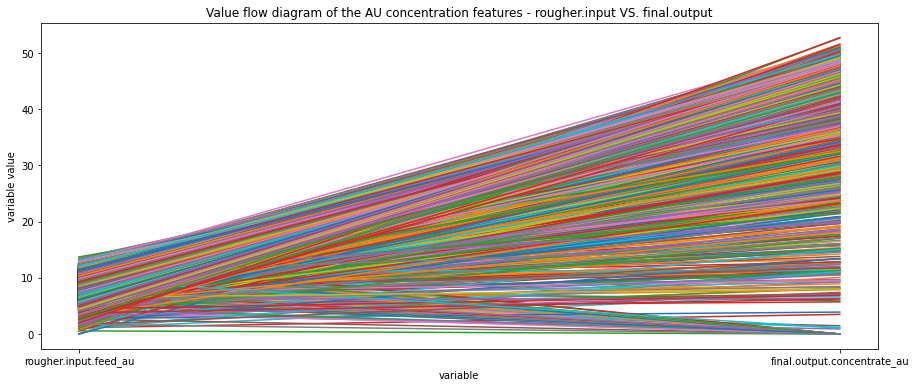

In [54]:
plt.figure(figsize=(15,6))
plt.plot(full[['rougher.input.feed_au', 'final.output.concentrate_au']].T)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram of the AU concentration features - rougher.input VS. final.output")
#plt.xticks(rotation=90)
plt.show()

Interestingly, for Au in general, one can see that the Au concentration raises from maximum about 15% in the rougher input to maximum above 50% in the final output; nevertheless, there are some artifacts of diminishing concentration as well (see downward lines on the graph). Let's take a look at the rougher output VS. final output:

In [55]:
concentrate_vars_au = [x for x in train.columns.to_list() if 'output.concentrate_au' in x]
concentrate_vars_au

['final.output.concentrate_au',
 'primary_cleaner.output.concentrate_au',
 'rougher.output.concentrate_au']

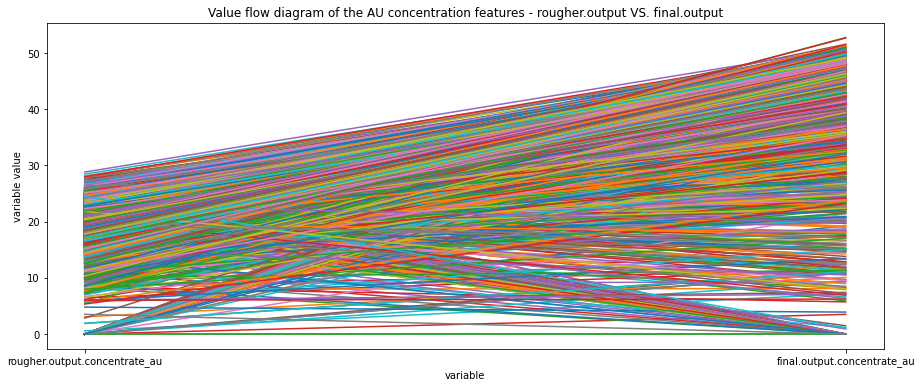

In [56]:
plt.figure(figsize=(15,6))
plt.plot(full[concentrate_vars_au[::-2]].T)  # we can list the items of the concentrate_vars_au list backward and skip one
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram of the AU concentration features - rougher.output VS. final.output")
#plt.xticks(rotation=90)
plt.show()

Even in a more pronounced way, we see that there are cases of diminishing Au concentration. Let's see the output of each steps together:

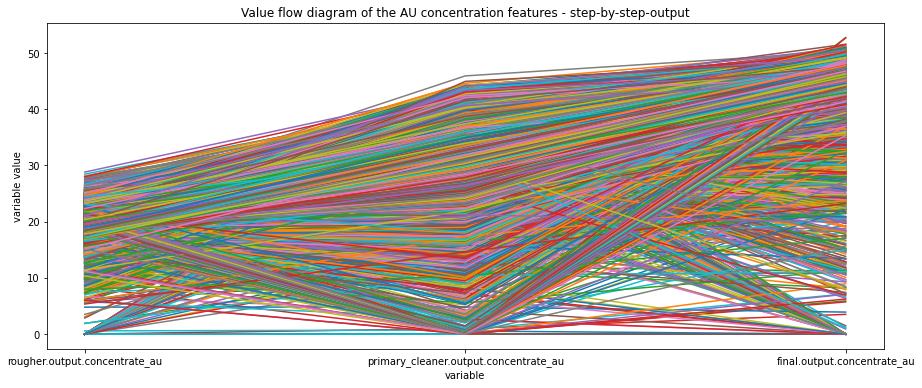

In [57]:
plt.figure(figsize=(15,6))
plt.plot(full[concentrate_vars_au[::-1]].T)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram of the AU concentration features - step-by-step-output")
#plt.xticks(rotation=90)
plt.show()

Here the things start to be even more ambiguous, since at this diagram we can trace also cases which have near zero concentration after the first purification and opposite cases of lower concentration after flotation and the second purification than after the first purification.

Let's try to count the regular cases of the growing concentration and estimate the possible impact of the rest of the observations (which can present measurement errors or other kinds of artifacts) on the whole dataset:

Full dataset:

In [58]:
len(full)

19439

In [59]:
len(full[full['rougher.input.feed_au'] < full['rougher.output.concentrate_au']])

19038

In [60]:
len(full[(full['rougher.input.feed_au'] < full['rougher.output.concentrate_au'])
            & (full['rougher.output.concentrate_au'] < full['primary_cleaner.output.concentrate_au'])])

18515

In [61]:
len(full[(full['rougher.input.feed_au'] < full['rougher.output.concentrate_au'])
            & (full['rougher.output.concentrate_au'] < full['primary_cleaner.output.concentrate_au'])
            & (full['primary_cleaner.output.concentrate_au'] < full['final.output.concentrate_au'])])

18197

Train dataset:

In [62]:
len(train)

14149

In [63]:
len(train[train['rougher.input.feed_au'] < train['rougher.output.concentrate_au']])

13845

In [64]:
len(train[(train['rougher.input.feed_au'] < train['rougher.output.concentrate_au'])
            & (train['rougher.output.concentrate_au'] < train['primary_cleaner.output.concentrate_au'])])

13440

In [65]:
len(train[(train['rougher.input.feed_au'] < train['rougher.output.concentrate_au'])
            & (train['rougher.output.concentrate_au'] < train['primary_cleaner.output.concentrate_au'])
            & (train['primary_cleaner.output.concentrate_au'] < train['final.output.concentrate_au'])])

13227

For about 400 observations in the full dataset and 300 observations in the train dataset the rougher input Au concentration is lower than the rougher output Au concentration... by tunneling further towards the final output Au concentrations we have another 850 observations in the full dataset and around 620 observations in the train dataset for which the output has lower Au concentration than at the previous step. We can also illustrate it:

In [66]:
funnel_steps = ['input', 'rougher', 'first purification', 'final']
funnel_values = [len(train),
                len(train[train['rougher.input.feed_au'] < train['rougher.output.concentrate_au']]),
                len(train[(train['rougher.input.feed_au'] < train['rougher.output.concentrate_au'])
                        & (train['rougher.output.concentrate_au'] < train['primary_cleaner.output.concentrate_au'])]),
                len(train[(train['rougher.input.feed_au'] < train['rougher.output.concentrate_au'])
                        & (train['rougher.output.concentrate_au'] < train['primary_cleaner.output.concentrate_au'])
                        & (train['primary_cleaner.output.concentrate_au'] < train['final.output.concentrate_au'])])]

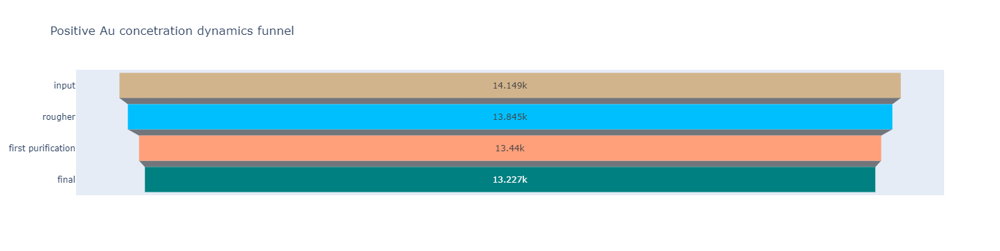

In [67]:
fig = go.Figure(go.Funnel(
   y = funnel_steps,
    x = funnel_values,
    marker = {"color": ["tan", "deepskyblue", "lightsalmon", "teal"]}, 
    ))

fig.update_layout(title = "Positive Au concetration dynamics funnel")

fig.show()

So, the Au concentration in the output grows with the next step in 93.5% of observations. 

Let's check Ag and Pb concentration:

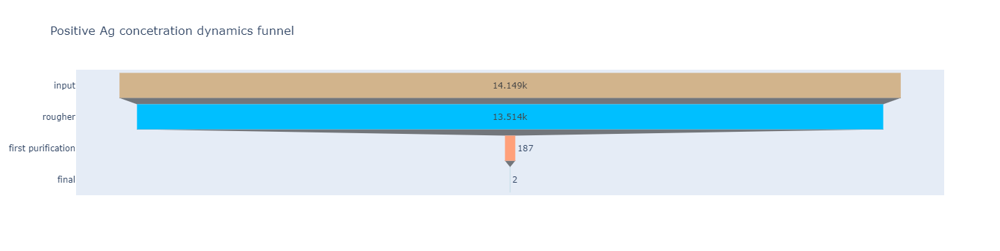

In [68]:
funnel_steps = ['input', 'rougher', 'first purification', 'final']
funnel_values_ag = [len(train),
                len(train[train['rougher.input.feed_ag'] < train['rougher.output.concentrate_ag']]),
                len(train[(train['rougher.input.feed_ag'] < train['rougher.output.concentrate_ag'])
                        & (train['rougher.output.concentrate_ag'] < train['primary_cleaner.output.concentrate_ag'])]),
                len(train[(train['rougher.input.feed_ag'] < train['rougher.output.concentrate_ag'])
                        & (train['rougher.output.concentrate_ag'] < train['primary_cleaner.output.concentrate_ag'])
                        & (train['primary_cleaner.output.concentrate_ag'] < train['final.output.concentrate_ag'])])]
fig = go.Figure(go.Funnel(
   y = funnel_steps,
    x = funnel_values_ag,
    marker = {"color": ["tan", "deepskyblue", "lightsalmon", "teal"]}, 
    ))

fig.update_layout(title = "Positive Ag concetration dynamics funnel")

fig.show()

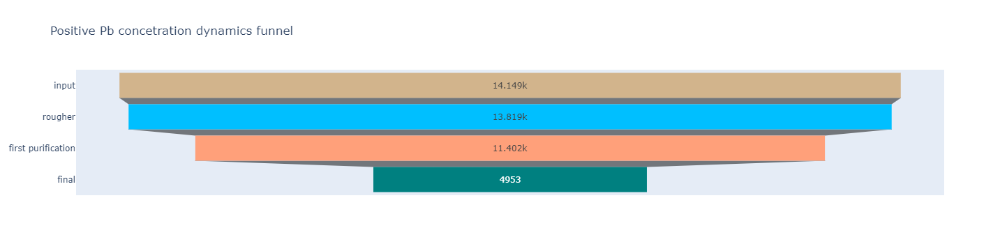

In [69]:
funnel_steps = ['input', 'rougher', 'first purification', 'final']
funnel_values_pb = [len(train),
                len(train[train['rougher.input.feed_pb'] < train['rougher.output.concentrate_pb']]),
                len(train[(train['rougher.input.feed_pb'] < train['rougher.output.concentrate_pb'])
                        & (train['rougher.output.concentrate_pb'] < train['primary_cleaner.output.concentrate_pb'])]),
                len(train[(train['rougher.input.feed_pb'] < train['rougher.output.concentrate_pb'])
                        & (train['rougher.output.concentrate_pb'] < train['primary_cleaner.output.concentrate_pb'])
                        & (train['primary_cleaner.output.concentrate_pb'] < train['final.output.concentrate_pb'])])]
fig = go.Figure(go.Funnel(
   y = funnel_steps,
    x = funnel_values_pb,
    marker = {"color": ["tan", "deepskyblue", "lightsalmon", "teal"]}, 
    ))

fig.update_layout(title = "Positive Pb concetration dynamics funnel")

fig.show()

It looks like the maximum growth in the concentration of silver takes place at the flotation step, while for the next steps output the concentration diminishes. Only in 35% of the cases the concentration of Pb grows in the output of every step.

[Back to Content](#content)

### Total concentrations

Let's consider the total concentrations of all substances at different stages.

In [70]:
feed_conc_vals_list = [x for x in train.columns.to_list() if ('input.feed_' in x) & (len(x.split('_')[-1]) == 2)]
feed_conc_vals_list

['rougher.input.feed_ag', 'rougher.input.feed_pb', 'rougher.input.feed_au']

In [71]:
conc_vals_list = [x for x in train.columns.to_list() if ('concentrate_' in x) & ('_sol' not in x)]
conc_vals_list

['final.output.concentrate_ag',
 'final.output.concentrate_pb',
 'final.output.concentrate_au',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_au',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_au']

In [72]:
train['final.output.concentrate_'] = train[[x for x in conc_vals_list if 'final' in x]].sum(axis=1)

In [73]:
train['primary_cleaner.output.concentrate_'] = train[[x for x in conc_vals_list if 'primary' in x]].sum(axis=1)

In [74]:
train['rougher.output.concentrate_'] = train[[x for x in conc_vals_list if 'rougher' in x]].sum(axis=1)

In [75]:
train['rougher.input.concentrate_'] = train[feed_conc_vals_list].sum(axis=1)

In [76]:
all_conc_vals_list = [x for x in train.columns.to_list() if ('concentrate_' in x) & ('_sol' not in x)]
all_conc_vals_list

['final.output.concentrate_ag',
 'final.output.concentrate_pb',
 'final.output.concentrate_au',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_au',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_au',
 'final.output.concentrate_',
 'primary_cleaner.output.concentrate_',
 'rougher.output.concentrate_',
 'rougher.input.concentrate_']

In [77]:
train[all_conc_vals_list[-4:]].head(1)

,final.output.concentrate_,primary_cleaner.output.concentrate_,rougher.output.concentrate_,rougher.input.concentrate_
date,,,,
2016-01-15,58.137072,53.111627,38.395653,14.87144


Let's take a look at the histograms of total concentrations:

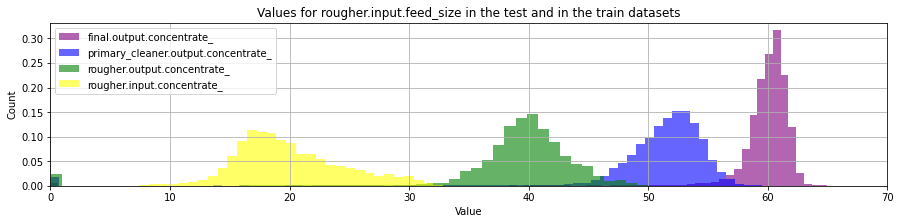

In [78]:
plt.figure(figsize=(15, 3))

train['final.output.concentrate_'].hist(color = "purple", bins = 100, density=True, alpha = 0.6)
train['primary_cleaner.output.concentrate_'].hist(color = "blue", bins = 80, density = True, alpha = 0.6)
train['rougher.output.concentrate_'].hist(color = "green", bins = 60, density = True, alpha = 0.6)
train['rougher.input.concentrate_'].hist(color = "yellow", bins = 40, density = True, alpha = 0.6)

plt.title('Values for rougher.input.feed_size in the test and in the train datasets')
plt.xlabel('Value')
plt.ylabel('Count')
plt.legend(['final.output.concentrate_', 'primary_cleaner.output.concentrate_',
            'rougher.output.concentrate_', 'rougher.input.concentrate_'])
plt.xlim(0,70)
plt.show()

We can see that, in general, the total concentration growths, though there are zero observations, and sometimes concentration at the next stage can be lower than in the previous. Let's check the flow.

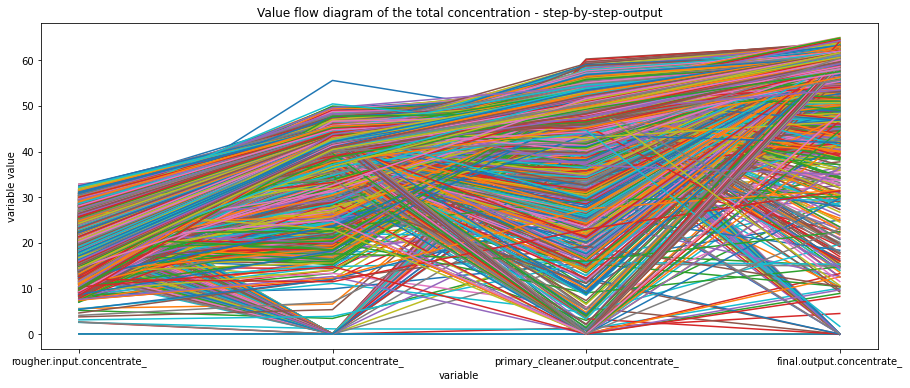

In [79]:
plt.figure(figsize=(15,6))
plt.plot(train[all_conc_vals_list[-4:][::-1]].T)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram of the total concentration - step-by-step-output")
#plt.xticks(rotation=90)
plt.show()

As we have seen from the Au step concentration example, at this diagram as well, we can trace cases which have near zero concentration at one of the intermediate steps and higher concentration at the steps before and after. Let's check the proportions of "regular" concentrations at each step:

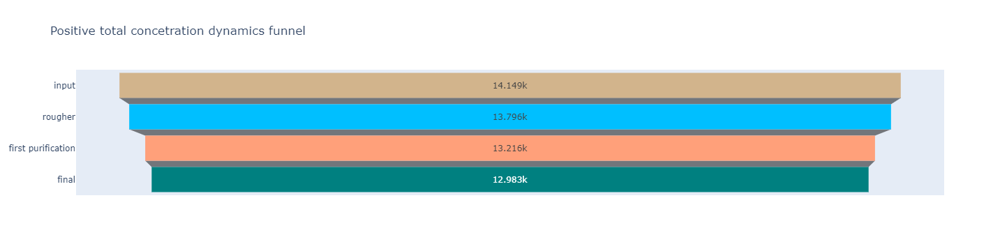

In [80]:
funnel_steps = ['input', 'rougher', 'first purification', 'final']
funnel_values_pb = [len(train),
                len(train[train['rougher.input.concentrate_'] < train['rougher.output.concentrate_']]),
                len(train[(train['rougher.input.concentrate_'] < train['rougher.output.concentrate_'])
                        & (train['rougher.output.concentrate_'] < train['primary_cleaner.output.concentrate_'])]),
                len(train[(train['rougher.input.concentrate_'] < train['rougher.output.concentrate_'])
                        & (train['rougher.output.concentrate_'] < train['primary_cleaner.output.concentrate_'])
                        & (train['primary_cleaner.output.concentrate_'] < train['final.output.concentrate_'])])]
fig = go.Figure(go.Funnel(
   y = funnel_steps,
    x = funnel_values_pb,
    marker = {"color": ["tan", "deepskyblue", "lightsalmon", "teal"]}, 
    ))

fig.update_layout(title = "Positive total concetration dynamics funnel")

fig.show()

91.8% of the initial dataset demonstrate expected concentration growth pattern; with regard to the rest we will remember to ask our field experts about the possible reasons.

In [81]:
# extract the indices for the regular observations
pure_indices = train[(train['rougher.input.concentrate_'] < train['rougher.output.concentrate_'])
                        & (train['rougher.output.concentrate_'] < train['primary_cleaner.output.concentrate_'])
                        & (train['primary_cleaner.output.concentrate_'] < train['final.output.concentrate_'])].index
pure_indices = list(pure_indices)

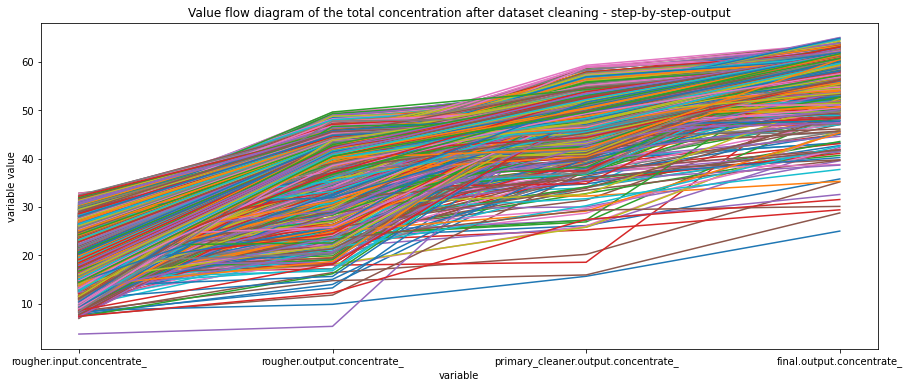

In [82]:
plt.figure(figsize=(15,6))
plt.plot(train.loc[pure_indices,:][all_conc_vals_list[-4:][::-1]].T)
plt.xlabel('variable')
plt.ylabel('variable value')
plt.title(f"Value flow diagram of the total concentration after dataset cleaning - step-by-step-output")
#plt.xticks(rotation=90)
plt.show()

In the test dataset, we do not have concentrations except the rougher input, but normally we expect growing concentration values; thus, to avoid any impact of what presumably seems to be measurement errors on the model, in what follows, we will drop the irregular observations. 

[Back to Content](#content)

### Recovery calculations

We have seen, that the test set contains some limited set of the features, only `input` and `state` variables, no calculated data, which is reasonable, since we assume that no a posteriory data can be available at the start of the process and we want to make the predictions at the start. That means than we have to use only this set of features when we train the model and the two target variables:

- rougher concentrate recovery - `rougher.output.recovery`;
- final concentrate recovery - `final.output.recovery`.

Before we continue with the final train and test dataset preparation, let's take a look at the distribution of the target variable (we remember that the `train` dataset has missing variables filled, so we will use the raw data, to avoid any artifacts):

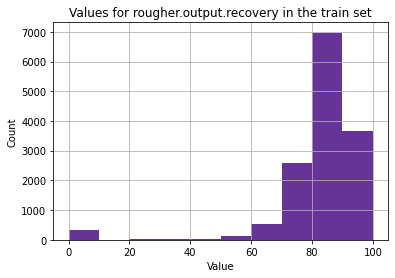

In [83]:
train_raw['rougher.output.recovery'].hist(color = "rebeccapurple")
plt.title('Values for rougher.output.recovery in the train set')
plt.xlabel('Value')
plt.ylabel('Count')
plt.show()

In [84]:
train_raw['rougher.output.recovery'].describe()

count    14287.000000
mean        82.394201
std         15.096808
min          0.000000
25%         79.818372
50%         85.235997
75%         90.131691
max        100.000000
Name: rougher.output.recovery, dtype: float64

Looks reasonable. Note, that there are zero values as well, though 25% of data points have the recovery rate up to 78.5%.

Let's make a check whether the recovery is calculated correctly. To this end, we will use the training set, calculate recovery for the `rougher.output.recovery` feature and find the MAE between our calculations and the feature values. Here we have the list of the variables we need:

- `rougher.input.feed_au` - F — share of gold in the feed before flotation;
- `rougher.output.concentrate_au` - C — share of gold in the concentrate right after flotation;
- `rougher.output.tail_au` - T — share of gold in the rougher tails right after flotation.

Let's take a look at the distribution of the features, which will be involved in the calculation.

In [85]:
calc_list = ['rougher.input.feed_au', 'rougher.output.concentrate_au', 'rougher.output.tail_au']

In [86]:
train_raw[calc_list].describe()

,rougher.input.feed_au,rougher.output.concentrate_au,rougher.output.tail_au
count,16777.000000,16778.000000,14611.000000
mean,7.170717,17.401541,1.763930
std,3.002113,6.921875,0.731518
min,0.000000,0.000000,0.020676
25%,6.203083,17.443663,1.311610
50%,7.443530,19.644663,1.747907
75%,8.965193,21.224486,2.190839
max,14.093363,28.522811,9.688980


Well, here we have zero or near-zero values as well and, in general, the rougher Au concentration raises and the tail Au concentration drops, as expected. additionally, we have a significant share of datapoints for which we do not have data on the the share of gold in the rougher tails (`T`); the final number of datapoints which do have the rougher recovery calculated is even less, 14287.

Let's perform the calculations. First we should slice a data subset which is clean from missing values:

In [87]:
calc_list.append('rougher.output.recovery')

In [88]:
recovery_df = train_raw[calc_list]

In [89]:
recovery_df.dropna(inplace = True)

<ipython-input-89-02a4b1076094>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [90]:
numerator = (recovery_df['rougher.output.concentrate_au']*(recovery_df['rougher.input.feed_au']
                                                               - recovery_df['rougher.output.tail_au']))

In [91]:
denominator = (recovery_df['rougher.input.feed_au']*(recovery_df['rougher.output.concentrate_au']
                                                            - recovery_df['rougher.output.tail_au']))

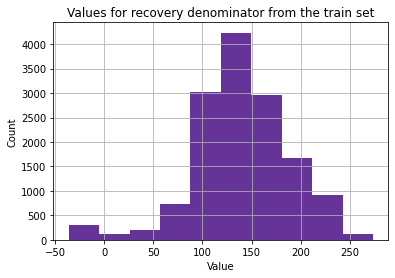

In [92]:
denominator.hist(color = "rebeccapurple")
plt.title('Values for recovery denominator from the train set')
plt.xlabel('Value')
plt.ylabel('Count')
plt.show()

In [93]:
denominator.describe(include = 'all')

count    14287.000000
mean       139.503680
std         48.815338
min        -36.207020
25%        112.696554
50%        137.481145
75%        170.612645
max        273.588883
dtype: float64

We see some zero and negative values, meaning that sometimes the shares of the gold in the flotation output and in the tails are equal or the tails have even higher registered share of Au in them than that measured for the flotation output. For those datapoints we will have to define that the recovery rate is zero: it can be the case, that the concentration measurement is not valid for some data points, let's check:

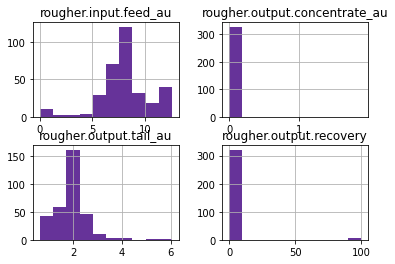

In [94]:
recovery_df[(recovery_df['rougher.output.concentrate_au']
             -recovery_df['rougher.output.tail_au']) < 0].hist(color = "rebeccapurple")
plt.show()

In [95]:
recovery_df[(recovery_df['rougher.output.concentrate_au']
             -recovery_df['rougher.output.tail_au']) <= 0].describe(include = 'all')

,rougher.input.feed_au,rougher.output.concentrate_au,rougher.output.tail_au,rougher.output.recovery
count,329.000000,329.000000,329.000000,329.000000
mean,8.084038,0.007692,1.928677,2.142146
std,2.407034,0.108743,0.677521,13.956621
min,0.010000,0.000000,0.638096,0.000000
25%,7.114252,0.000000,1.569364,0.000000
50%,7.995163,0.000000,1.956189,0.000000
75%,9.026122,0.000000,2.209001,0.000000
max,12.559249,1.889855,6.067395,100.000000


OK, now we see that there are about 320 data points with zero and near-zero Au concentration in the flotation output (the average value equals 0.0077), which seems to be kind of a measurement error; thus, for those data points we will define zero recovery:

In [96]:
zero_recovery_indices = list(recovery_df[(recovery_df['rougher.output.concentrate_au']
             -recovery_df['rougher.output.tail_au']) < 0].index)

In [97]:
recovery_df['recovery_check'] = 100*((recovery_df['rougher.output.concentrate_au']*(recovery_df['rougher.input.feed_au']
                                                               - recovery_df['rougher.output.tail_au']))/
                               (recovery_df['rougher.input.feed_au']*(recovery_df['rougher.output.concentrate_au']
                                                            - recovery_df['rougher.output.tail_au']))
                              )

<ipython-input-97-20f9b44b147a>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [98]:
recovery_df.loc[zero_recovery_indices,:]['recovery_check'] = 0

Let's take a look at the distribution of the calculated variable:

In [99]:
recovery_df['recovery_check'].describe(include = 'all')

count    14287.000000
mean        82.394201
std         15.096808
min         -0.000000
25%         79.818372
50%         85.235997
75%         90.131691
max        100.000000
Name: recovery_check, dtype: float64

In [100]:
train_rougher_check_mae = mean_absolute_error(recovery_df['recovery_check'],recovery_df['rougher.output.recovery'])
train_rougher_check_mae

9.303415616264301e-15

The `train_rougher_check_mae` value is essentially zero; thus, the rougher recovery given in the train dataset is correct.

[Back to Content](#content)

### Feature list details - preparing the data for modeling

As we have already noticed, not all the features are available in the test set:

In [101]:
[x for x in train.columns.to_list() if x not in test.columns.to_list()]

['final.output.concentrate_ag',
 'final.output.concentrate_pb',
 'final.output.concentrate_sol',
 'final.output.concentrate_au',
 'final.output.recovery',
 'final.output.tail_ag',
 'final.output.tail_pb',
 'final.output.tail_sol',
 'final.output.tail_au',
 'primary_cleaner.output.concentrate_ag',
 'primary_cleaner.output.concentrate_pb',
 'primary_cleaner.output.concentrate_sol',
 'primary_cleaner.output.concentrate_au',
 'primary_cleaner.output.tail_ag',
 'primary_cleaner.output.tail_pb',
 'primary_cleaner.output.tail_sol',
 'primary_cleaner.output.tail_au',
 'rougher.calculation.sulfate_to_au_concentrate',
 'rougher.calculation.floatbank10_sulfate_to_au_feed',
 'rougher.calculation.floatbank11_sulfate_to_au_feed',
 'rougher.calculation.au_pb_ratio',
 'rougher.output.concentrate_ag',
 'rougher.output.concentrate_pb',
 'rougher.output.concentrate_sol',
 'rougher.output.concentrate_au',
 'rougher.output.recovery',
 'rougher.output.tail_ag',
 'rougher.output.tail_pb',
 'rougher.output.ta

The test dataset does not include all the measured and calculated features, since they are a posteriori information, which should be excluded while training a model to avoid target leakage. Thus, to get the training feature list, we should modify our training set to include only the basic features and the two target variables. Additionally, as we showed earlier, the train dataset should include only observations with timestamp indices from the `pure_indices` list. Finally, we will remember that it can be necessary to apply the `.reset_index()` method to drop the timeseries indices later on (we remember that we turned the test dataset into a time series dataset to analyze the feature behaviour along the timeline).

In [102]:
X_train = train.loc[pure_indices,:][test.columns.to_list()]

In [103]:
Y_train = train.loc[pure_indices,:][['rougher.output.recovery', 'final.output.recovery']].values # np.arrays for the scorer

Additionally, our test dataset includes only the features and not the target variables; thus, we have to extract the target variables for the corresponding indices of the test dataset fom the full dataset:

Note: we remember that we dropped observations with missing target values from the full dataset, so we need to make sure that our final test dataset contains only indices for which the values of the target variables are present.

In [104]:
test_pure_indices = [x for x in test.index if x in full.index]  # take indices which are present in `full` dataframe indices

In [105]:
X_test = test.loc[test_pure_indices,:]

In [106]:
Y_test = full.loc[test_pure_indices,:][['rougher.output.recovery', 'final.output.recovery']].values

### Quick summary on the data overview

1. We have uploaded the three datasets, `train`, `test`, and `full`; there are 22715 data points in the raw full dataset, all columns and data types were correct, except the `date` variable, which we cast to the datetime to check the time dependent nature of the data through applying time series visualization; the full dataset does not have duplicated data points, though there were missing values for some variables, which, based on the time series nature of the data again, we filled with lineary interpolated data.
2. The test period consists of two chunks of time: September to December, 2016 and September to December, 2018; the training set consist of the rest of the data points between January, 2016 and August, 2018; it can be the case that the model should evolve with the time; thus, in case a static model is considered, it can be worth to compare two training and testing subsets - for 2016 and 2017, correspondingly.
3. Correlation analysis did not result in any quick conclusions, the dependencies in the ore processing seem to be pretty complex with some non-linear dependency on particle sizes of the rogher input.
4. It turned out that the distributions of the particle sizes differ for the train and the test datasets; moreover, the distributions of the particle sizes are different for each period of time within both the training and the testing datasets; to avoid ambiguous results while evaluating the models, we will employ cross-validation to help us make the distribution of each validation subset as close to the original data as possible, and hopefully build a more robustic model, which will score decently on the test dataset as well.
5. Additionally, we showed, both on the Au case and for the total values, that the concentration values in the train dataset could inherit some measurement errors; thus, to avoid any impact on the model we suggested to keep only observations which exhibited the expected growth in the concentration values along the purification process.
6. We showed that the `rougher.output.recovery` in the train dataset is correctly calculated; additionaly, we noticed that there are ~320 observation points with zero or near-zero Au concentrations in the flotation output.
7. We prepared the data to train models: `X_train`, `Y_train`, `X_test`, and `Y_test`.

Let's train and test the model!

[Back to Content](#content)

## Machine Learning <a id='ml'></a>

We have already split the data into a training and a test subsets and we will employ cross-validation to evaluate the model quality; thus, we do not need to split the training dataset into training and validation in advance, and our steps are: 

1. Write a function to calculate the final sMAPE value.
2. Scale the features.
3. Sanity check (dummy regression).
3. Train different models and evaluate them using cross-validation.
4. Pick the best model and test it using the test sample.

The last step for the project will be summarizing the findings.


NOTE: We have elaborated on the need to employ the cross-validation technique in our conclusion on the the particle size distribution study case.

### sMAPE function

We already know, that the best metric to use for the task at hand is a combined sMAPE metric, where:

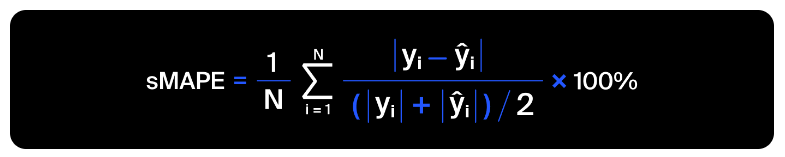

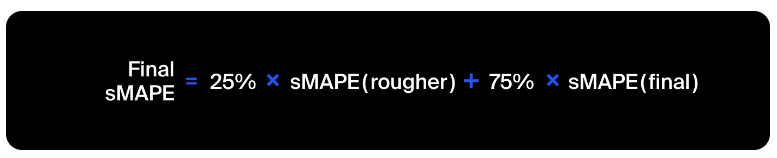


sMAPE has both a lower bound and an upper bound and, in this version, provides a result between 0% and 200%; thus, the less is the better (!).

Let's write a function to calculate the final sMAPE value and define it as a user-defined scroring function.

In [107]:
def smape(y_true: pd.Series, y_pred:pd.Series) -> float:  # type hint to stress that the function takes two arrays
    """Calculate the sMAPE metric"""
    smape = 100*(np.abs(y_true - y_pred)/((np.abs(y_true) + np.abs(y_pred))/2)).mean()
    
    return smape

def f_smape(y_true: pd.DataFrame, y_pred: pd.DataFrame) -> float:  # type hint to stress that the function takes 4 arrays
    """Calculate the final sMAPE metric"""
    smape_rougher = smape(y_true[:,0], y_pred[:,0])  
    smape_final = smape(y_true[:,1], y_pred[:,1])
    return ((0.25 * smape_rougher) + (0.75 * smape_final))

We will [`make_scorer()`](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.make_scorer.html) function to wrap `f_mape` scoring function for use in `cros_val_score`. In our case the lower is the metric value the better; thus, we should define the `greater_is_better` parameter of the `make_scorer()` function to be `False`. In this case, the scorer object will sign-flip the outcome, which should be taken into account.

In [108]:
smape_score = make_scorer(f_smape, greater_is_better=False)  # sMAPE as a user-defined scoring function

### Feature scaling

The numerical features in the dataset have different scales, so we have to standardize them. We will define the scaler and use it as part of a pipeline.

In [109]:
scaler = StandardScaler()

### Sanity check

In [110]:
dummy_check = DummyRegressor()  # using DummyRegressor to built a baseline model

In [111]:
pipe = Pipeline([('scaler', scaler), ('dummy_model', dummy_check)])

In [112]:
pipe.fit(X_train, Y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('dummy_model', DummyRegressor())])

In [113]:
Y_dummy_predictions = pd.DataFrame(pipe.predict(X_test)).values # cast to np.arrays for the score to work

In [114]:
print(f"The final sMAPE score for the dummy model equals {f_smape(Y_test, Y_dummy_predictions):.2f}%.")

The final sMAPE score for the dummy model equals 9.84%.


Thus, our baseline final sMAPE score equals 9.84%.

### Modeling

Let's try to apply the cross-validation to five iterations (`k=50`) using the basic Linear Regression:

In [115]:
k = 50

In [116]:
linear = linear_model.LinearRegression()
pipe = Pipeline([('scaler', scaler), ('linear', linear)])
print((cross_val_score(pipe, X_train, Y_train, cv=k, scoring = smape_score)).mean())

-7.843539614457546


Thus, basic linear model result in the final sMAPE score of 7.84%, 2% less than the dummy model.

Let's put together a function to  run the models:

In [117]:
def model_run(estimator, feat_train, target_train, cv_k, scoring_func):
    """The function takes a model, the training datasets, and returns the mean across cv_k cross-validation scores."""
    scaler = StandardScaler()
    pipe = Pipeline([('scaler', scaler), ('estimator', estimator)])
    res = cross_val_score(pipe, feat_train, target_train, cv=cv_k, scoring = scoring_func).mean()
    print(f'The mean across {cv_k} evaluation scores equals: {-res:.2f}%.')
    
    return res

Let's declare the models: we will check the least square models without and with regularization and a Random Forest model (for which the mape_score will be actually applied).

In [118]:
models = [linear_model.LinearRegression(),   # use basic models configurations
          linear_model.Lasso(random_state = 12345),
          linear_model.Ridge(random_state = 12345),
          ensemble.RandomForestRegressor(n_estimators = 20, random_state = 12345)]

Let's run the models:

In [119]:
results = {}

for key, est in zip(range(0, len(models)), models):
    print(f"Model {key+1} - {models[key]}:")
    pipe = Pipeline([('scaler', scaler), ('estimator', est)])
    results[key] = model_run(pipe, X_train, Y_train, 10, smape_score)  # use 10 cross-validation subsets

Model 1 - LinearRegression():
The mean across 10 evaluation scores equals: 8.85%.
Model 2 - Lasso(random_state=12345):
The mean across 10 evaluation scores equals: 8.20%.
Model 3 - Ridge(random_state=12345):
The mean across 10 evaluation scores equals: 8.85%.
Model 4 - RandomForestRegressor(n_estimators=20, random_state=12345):
The mean across 10 evaluation scores equals: 8.40%.


So far, the basic Lasso model (linear least squares with l1 regularization, meaning that there is a best feature subset among the many features we have at hand) results in the lowest value, 8.20%, of the final sMAPE score. The Random Forest which we have run with 20 estimators (NOTE: running it for 10 iterations is very time consuming as compared to the linear models) is actually the closest to the result of the Lasso model, so let's check whether we can improve it. Note, with 10 cross-validation sets the fianl estimate of the scroing metric is higher, than with 50.

First, let's check what are the parameters currently in use. We will call `.get_params()` on est, since the Random Forest was the last model in the for loop above and expect to see a default set:

In [120]:
print('Parameters currently in use:\n')
print(est.get_params())

Parameters currently in use:

{'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 1.0, 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 20, 'n_jobs': None, 'oob_score': False, 'random_state': 12345, 'verbose': 0, 'warm_start': False}


To optimize the hyperparameters of the Random Forest model, we will apply the `RandomizedSearchCV` method and perform cross-validation using its `cv` parameter. `RandomizedSearchCV` is relatively cost- (computationally less intensive) and time-effective (faster – less computational time), e.g. as compared to the `GridSearchCV` method: [link](https://jmlr.csail.mit.edu/papers/volume13/bergstra12a/bergstra12a.pdf). 

In [121]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint  # for initializing random integer values

In [122]:
pipe = Pipeline([('scaler', scaler), ('rf', ensemble.RandomForestRegressor(random_state=12345))])

In [123]:
rs1 = RandomizedSearchCV(
    pipe,
    param_distributions = {"rf__max_depth": range(2,10),
              "rf__min_samples_split": sp_randint(2, 10),
              "rf__min_samples_leaf": sp_randint(2, 30),
              "rf__max_leaf_nodes": sp_randint(2,50),
              "rf__bootstrap": [True, False],
              "rf__n_estimators": sp_randint(20,100),
              "rf__max_features": ['sqrt', 'log2', None]
             },
    scoring=smape_score,
    n_iter=50,
    cv = 10
    #refit=smape_score
)

In [124]:
rs1.fit(X_train, Y_train)

RandomizedSearchCV(cv=10,
                   estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                             ('rf',
                                              RandomForestRegressor(random_state=12345))]),
                   n_iter=50,
                   param_distributions={'rf__bootstrap': [True, False],
                                        'rf__max_depth': range(2, 10),
                                        'rf__max_features': ['sqrt', 'log2',
                                                             None],
                                        'rf__max_leaf_nodes': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001CD92574610>,
                                        'rf__min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001CD92559DF0>,
                                        'rf__min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001CD92574220>,
                                        'rf__n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001CD92559910>},
                   scoring=make_scorer(f_smape, greater_is_better=False))

In [125]:
rs1.best_params_

{'rf__bootstrap': True,
 'rf__max_depth': 7,
 'rf__max_features': 'sqrt',
 'rf__max_leaf_nodes': 33,
 'rf__min_samples_leaf': 23,
 'rf__min_samples_split': 3,
 'rf__n_estimators': 64}

In [126]:
- rs1.best_score_  # remember that the scorer object sign-flips the outcome, since the lower score the better

7.796851614224134

Finally, we succeeded in improving the final sMAPE score by 0.6% down to 7.8%, which is 0.4% better than for the Lasso model.

Let's apply the best `rs1` model parameters.

In [127]:
best_rf_params = {}
for key in rs1.best_params_:
    best_rf_params[key[4:]] = rs1.best_params_[key]
best_rf_params

{'bootstrap': True,
 'max_depth': 7,
 'max_features': 'sqrt',
 'max_leaf_nodes': 33,
 'min_samples_leaf': 23,
 'min_samples_split': 3,
 'n_estimators': 64}

In [128]:
final_model = ensemble.RandomForestRegressor(random_state = 12345, **best_rf_params)

In [129]:
print(f"Model 5 - {final_model}:")
pipe = Pipeline([('scaler', scaler), ('model', final_model)])
results[4] = model_run(pipe, X_train, Y_train, 10, smape_score)  # use 10 cross-validation subsets

Model 5 - RandomForestRegressor(max_depth=7, max_features='sqrt', max_leaf_nodes=33,
                      min_samples_leaf=23, min_samples_split=3, n_estimators=64,
                      random_state=12345):
The mean across 10 evaluation scores equals: 7.80%.


Now we should test the best model using the test sample:

In [130]:
pipe.fit(X_train, Y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('model',
                 RandomForestRegressor(max_depth=7, max_features='sqrt',
                                       max_leaf_nodes=33, min_samples_leaf=23,
                                       min_samples_split=3, n_estimators=64,
                                       random_state=12345))])

In [131]:
best_model_predictions = pipe.predict(X_test)

In [132]:
print(f"The test datset sMAPE score for the the best model equals {f_smape(Y_test, best_model_predictions):.2f}%.")

The test datset sMAPE score for the the best model equals 8.97%.


Well, eventually, on the test dataset, the best Random Forest model results in poor predictions as well, 9% compared to 9.8% of the dummy model, which uses `mean` values for predictions.

In general, it might be beneficial to try building a dynamic model, which will be constantly updated with new data, since the production conditions seem to be changing constantly.

[Back to Content](#content)

### Comparing to the full train dataset

To wrap up, let's compare and estimate what would be the results if we continue keeping the observations with inconsistent concentration measurement results.

The data:

In [136]:
X_train_full = train[test.columns.to_list()]

In [137]:
Y_train_full = train[['rougher.output.recovery', 'final.output.recovery']].values

In [138]:
X_test_full = test.copy()

In [139]:
test_indices = [x for x in test.index.to_list() if x in full.index.to_list()]

In [140]:
X_test_full = test.loc[test_indices,:]

In [141]:
Y_test_full = full.loc[test_indices,:][['rougher.output.recovery', 'final.output.recovery']].values

Scaling:

In [142]:
scaler_full = StandardScaler()

Baseline:

In [143]:
dummy_check_full = DummyRegressor() 

Note: Usually, we would build a simple pipeline to scale (or normalize) the features and then to tun the model...

In [149]:
dummy_pipe = Pipeline([('model', dummy_check_full)])

...though in case of DummyRegressor and DummyClassifier, which only look at train set targets, scaling does nothing to them.

In [150]:
dummy_pipe.fit(X_train_full, Y_train_full)

Pipeline(steps=[('model', DummyRegressor())])

In [152]:
Y_dummy_predictions_full = pd.DataFrame(dummy_pipe.predict(X_test)).values 

In [153]:
print(f"The final sMAPE score for the full training set dummy model equals {f_smape(Y_test, Y_dummy_predictions_full):.2f}%.")

The final sMAPE score for the full training set dummy model equals 10.29%.


Basic models training:

In [154]:
full_train_set_results = {}

for key, est in zip(range(0, len(models)), models):
    print(f"Model {key+1} - {models[key]}:")
    pipe = Pipeline([('scaler', scaler), ('model', est)])
    full_train_set_results[key] = model_run(pipe, X_train_full, Y_train_full, 10, smape_score)

Model 1 - LinearRegression():
The mean across 10 evaluation scores equals: 11.56%.
Model 2 - Lasso(random_state=12345):
The mean across 10 evaluation scores equals: 10.23%.
Model 3 - Ridge(random_state=12345):
The mean across 10 evaluation scores equals: 11.55%.
Model 4 - RandomForestRegressor(n_estimators=20, random_state=12345):
The mean across 10 evaluation scores equals: 11.42%.


The best model turned to be the basic LinearRegression(), let's test it.

In [155]:
lr_check_full = linear_model.LinearRegression()  
full_pipe = Pipeline([('scaler', scaler), ('model', lr_check_full)])
full_pipe.fit(X_train_full, Y_train_full)
lr_check_full_predictions_full = pd.DataFrame(full_pipe.predict(X_test_full)).values 
print(f"The final sMAPE score for the Linear Regression model equals {f_smape(Y_test_full, lr_check_full_predictions_full):.2f}%.")

The final sMAPE score for the Linear Regression model equals 10.05%.


The scores, if we keep the observations with inconsistent values of the total concentrations in the train dataset, are better than for the clean train subset, while the test score of the best model (Linear Regression) below the score of the Dummy Regressor for the training dataset.

[Back to Content](#content)

## Conclusions and recommendations <a id='conclusions'></a>

At the preprocessing we uploaded three datasets, `train`, `test`, and `full`; all columns and data types were correct, except the `date` variable, which we cast to the datetime to check the time dependent nature of the data through applying time series visualization; the full dataset does not have duplicated data points, though there were missing values for some variables, which, based on the time series nature of the data again, we filled with lineary interpolated data.

As part of the data exploration, we found that:

1. The test period consists of two chunks of time: September to December, 2016 and September to December, 2018; the training set consist of the rest of the observations between January, 2016 and August, 2018; we made a preliminary conclusion that the production conditions could evolve with the time.
2. Correlation analysis did not result in any quick conclusions, the dependencies in the ore processing seem to be pretty complex, e.g. with some non-linear dependency on particle sizes of the rogher input; it also can be impact of the evolving production conditions.
3. We showed, both on the Au case and for the total values, that the concentration values in the train dataset could inherit some measurement errors (zero or near-zero values); thus, to avoid any impact on the model we suggested to keep only the observations which exhibited the expected growth in the concentration values along the purification process.
4. When studied in depth, the distributions of the particle sizes turned out to be different for the train and the test datasets; moreover, thee were different for different periods of time within the training and the testing datasets; to avoid ambiguous results while evaluating the models, we employed cross-validation to help us make the distribution of each validation subset as close to the original data as possible; nevertheless, we made a conclusion, that the differences in the feature distributions will impact the model evaluation.
5. Finally, we showed that the `rougher.output.recovery` in the train dataset is correctly calculated and noticed that there are ~320 observation points with zero or near-zero Au concentrations in the flotation output.

Preparing the data for the modeling included:

1. Constructing clean subsets of the data: `X_train`, `Y_train`, `X_test`, and `Y_test`; only those features were taken for the `X_train` subset, which we found in the `X_test` subset, since we are not supposed to have any a posteriori information being used for training models, i.e. we want to prevent the target leakage; additionally, only those 80% of observations were included, which demonstrated regular growth of the concentration values; the `Y_test` we had to extract from the full dataset, matching the same indices as in the `X_test`.
2. Then, we have scaled the features.
3. We applied `.make_scorer()` function to create a scorer, based on the final sMAPE formula, which uses sMAPE of both rougher and final recovery rate; we took into account the fact that this scorer works as a loss function, the less is better.

At the modeling step, we performed:

1. Sanity check - the dummy regression, which uses `mean` values for making predictions, resulted in 9.8% of weighted sMAPE score in case of the clean dataset and 10.3% in case of the raw dataset (the one with seemingly inconsistent values of the total concentrations).
2. We compared three linear regression models, including basic versions of Lasso and Ridge, and a random forest model; we applied cross-validation to score the models; in all models we used `k=10` cross-validation subsets.
3. We also applied RandomizedSearchCV to finetune the hyperparameters of the Random Forest model, although the result was still unacceptable.
5. We compared the results received on the clean train subset and on the raw train dataset, when the observations which exhibit inconsistent dynamics of the total concentrations along the purification process are kept; the final model was just a Linear Regression on the raw dataset, although the test weighted sMAPE score of that model was 0.3% lower than that of a dummy model.

We can made the overall conclusion that building a more complex model, which will also be constantly updated with new data, could be a better option, since the production conditions seem to be constantly changing. Additionaly, the weights in the scoring function can be adjusted.

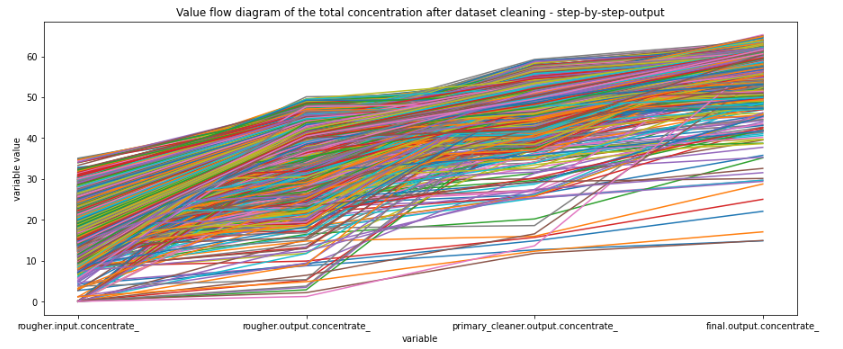

[Back to Content](#content)